## Import Libararies  

In [ ]:
import os
import json
import cv2
import random
import shutil
import numpy as np
import seaborn as sns
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from collections import defaultdict
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout

## Cloning the Files

In [ ]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Total 740 (delta 0), reused 0 (delta 0), pack-reused 740 (from 1)
Receiving objects: 100% (740/740), 107.77 MiB | 15.92 MiB/s, done.
Resolving deltas: 100% (498/498), done.


## Downloading Images

In [ ]:
%cd TACO
! python download.py
%cd ..

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished
/content


## Setting the Path to Data and Annotation File

In [ ]:
data_dir = "TACO/data"
annotation_file = "annotations.json"

This function loads the TACO dataset annotations from a specified JSON file. The annotations are read from the provided file path, and the data is returned as a dictionary, allowing for further processing and use in object detection tasks.

In [ ]:
def load_taco_annotations(annotation_file, data_dir):
    """
    Load TACO dataset annotations from JSON.

    Parameters:
        annotation_file (str): Name of the annotations file.
        data_dir (str): Directory containing the TACO dataset. Defaults to "TACO/data".

    Returns:
        dict: Loaded annotations data.
    """
    # Construct full path to the annotations file
    annotation_path = os.path.join(data_dir, annotation_file)

    # Load the annotations
    with open(annotation_path, 'r') as f:
        data = json.load(f)

    return data

In [ ]:
data = load_taco_annotations(annotation_file, data_dir)

## Display all the Classes in the Dataset

In [ ]:
def display_classes(data_dir, annotation_file, desired_classes=None):
    """
    Display all classes in the TACO dataset or a subset of desired classes.

    Parameters:
        data_dir (str): Path to the dataset directory.
        annotation_file (str): Annotation file name (JSON format).
        desired_classes (list, optional): List of desired class IDs to display. If None, display all classes.
    """
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Extract category names and IDs
    category_map = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Display classes
    if desired_classes is None:
        print("Displaying all classes in the TACO dataset:")
        for cat_id, cat_name in category_map.items():
            print(f"Class ID {cat_id}: {cat_name}")
    else:
        print("Displaying desired classes in the TACO dataset:")
        for cat_id in desired_classes:
            if cat_id in category_map:
                print(f"Class ID {cat_id}: {category_map[cat_id]}")
            else:
                print(f"Class ID {cat_id}: Not Found in the dataset.")

# Display all classes
display_classes(data_dir, annotation_file)

Displaying all classes in the TACO dataset:
Class ID 0: Aluminium foil
Class ID 1: Battery
Class ID 2: Aluminium blister pack
Class ID 3: Carded blister pack
Class ID 4: Other plastic bottle
Class ID 5: Clear plastic bottle
Class ID 6: Glass bottle
Class ID 7: Plastic bottle cap
Class ID 8: Metal bottle cap
Class ID 9: Broken glass
Class ID 10: Food Can
Class ID 11: Aerosol
Class ID 12: Drink can
Class ID 13: Toilet tube
Class ID 14: Other carton
Class ID 15: Egg carton
Class ID 16: Drink carton
Class ID 17: Corrugated carton
Class ID 18: Meal carton
Class ID 19: Pizza box
Class ID 20: Paper cup
Class ID 21: Disposable plastic cup
Class ID 22: Foam cup
Class ID 23: Glass cup
Class ID 24: Other plastic cup
Class ID 25: Food waste
Class ID 26: Glass jar
Class ID 27: Plastic lid
Class ID 28: Metal lid
Class ID 29: Other plastic
Class ID 30: Magazine paper
Class ID 31: Tissues
Class ID 32: Wrapping paper
Class ID 33: Normal paper
Class ID 34: Paper bag
Class ID 35: Plastified paper bag
Cla

## Visualizing Object and Image Distributions Across All Categories in the TACO Dataset
This function processes the TACO dataset by loading category annotations, counting the number of objects and unique images per category, and calculating their percentages. It then creates two horizontal bar plots: one showing the number of objects per category and the other showing the number of images, with annotations for both counts and percentages. This provides a comprehensive visual analysis of the dataset's category distributions.

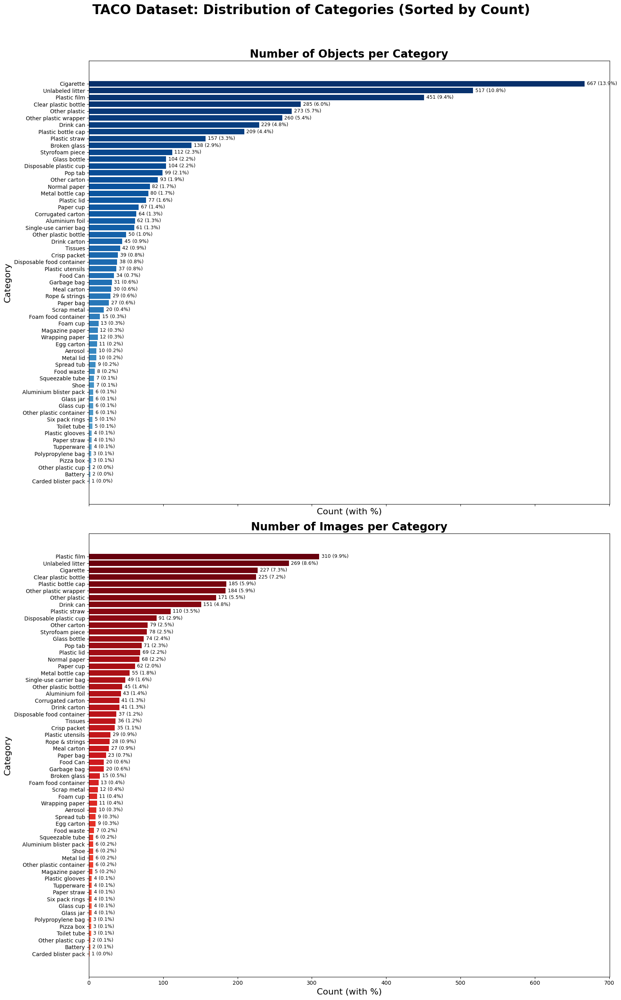

In [ ]:
def visualize_taco_categories(data_dir, annotation_file):
    """
    Visualize the TACO dataset categories with the number of objects and images per category.

    Parameters:
        data_dir (str): Directory containing the TACO dataset.
        annotation_file (str): Name of the annotations JSON file.
    """
    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        # Count the number of objects per category
        object_count[category_id] += 1

        # Track unique images for each category
        image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    data = {
        'Category': [categories[cat_id] for cat_id in object_count.keys()],
        'Number of Objects': [object_count[cat_id] for cat_id in object_count.keys()],
        'Number of Images': [image_count[cat_id] for cat_id in object_count.keys()]
    }

    # Create a pandas DataFrame
    df = pd.DataFrame(data)

    # Sort by the number of objects (Descending order)
    df_sorted_objects = df.sort_values(by='Number of Objects', ascending=True)

    # Sort by the number of images (Descending order)
    df_sorted_images = df.sort_values(by='Number of Images', ascending=True)

    # Calculate percentages for labels
    total_objects = df_sorted_objects['Number of Objects'].sum()
    total_images = df_sorted_images['Number of Images'].sum()
    df_sorted_objects['Percentage Objects'] = (df_sorted_objects['Number of Objects'] / total_objects) * 100
    df_sorted_images['Percentage Images'] = (df_sorted_images['Number of Images'] / total_images) * 100

    # Plotting horizontal histograms with enhancements
    fig, axes = plt.subplots(2, 1, figsize=(16, 26), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories (Sorted by Count)", fontsize=24, fontweight='bold')

    # Plot object count per category
    bars1 = axes[0].barh(
        df_sorted_objects['Category'], df_sorted_objects['Number of Objects'],
        color=plt.cm.Blues(np.linspace(0.5, 1, len(df_sorted_objects)))
    )
    axes[0].set_title("Number of Objects per Category", fontsize=20, fontweight='bold')
    axes[0].set_xlabel("Count (with %)", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=16)
    axes[0].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars1, df_sorted_objects['Number of Objects'], df_sorted_objects['Percentage Objects']):
        axes[0].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Plot image count per category (sorted consistently)
    bars2 = axes[1].barh(
        df_sorted_images['Category'], df_sorted_images['Number of Images'],
        color=plt.cm.Reds(np.linspace(0.5, 1, len(df_sorted_images)))
    )
    axes[1].set_title("Number of Images per Category", fontsize=20, fontweight='bold')
    axes[1].set_xlabel("Count (with %)", fontsize=16)
    axes[1].set_ylabel("Category", fontsize=16)
    axes[1].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars2, df_sorted_images['Number of Images'], df_sorted_images['Percentage Images']):
        axes[1].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Tight layout adjustments
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

visualize_taco_categories(data_dir, annotation_file)

## Visualizing TACO Dataset Images with Bounding Boxes for Specified or All Categories
This function loads the TACO dataset, displays images annotated with bounding boxes, and allows filtering for specific categories. If no categories are specified, it uses all available classes. Images are resized to a target size, and bounding boxes are scaled accordingly. The function overlays category labels on the bounding boxes and displays a maximum number of images, making it easier to visually inspect the dataset and its annotations.

Displaying all categories: {0: 'Aluminium foil', 1: 'Battery', 2: 'Aluminium blister pack', 3: 'Carded blister pack', 4: 'Other plastic bottle', 5: 'Clear plastic bottle', 6: 'Glass bottle', 7: 'Plastic bottle cap', 8: 'Metal bottle cap', 9: 'Broken glass', 10: 'Food Can', 11: 'Aerosol', 12: 'Drink can', 13: 'Toilet tube', 14: 'Other carton', 15: 'Egg carton', 16: 'Drink carton', 17: 'Corrugated carton', 18: 'Meal carton', 19: 'Pizza box', 20: 'Paper cup', 21: 'Disposable plastic cup', 22: 'Foam cup', 23: 'Glass cup', 24: 'Other plastic cup', 25: 'Food waste', 26: 'Glass jar', 27: 'Plastic lid', 28: 'Metal lid', 29: 'Other plastic', 30: 'Magazine paper', 31: 'Tissues', 32: 'Wrapping paper', 33: 'Normal paper', 34: 'Paper bag', 35: 'Plastified paper bag', 36: 'Plastic film', 37: 'Six pack rings', 38: 'Garbage bag', 39: 'Other plastic wrapper', 40: 'Single-use carrier bag', 41: 'Polypropylene bag', 42: 'Crisp packet', 43: 'Spread tub', 44: 'Tupperware', 45: 'Disposable food container', 4

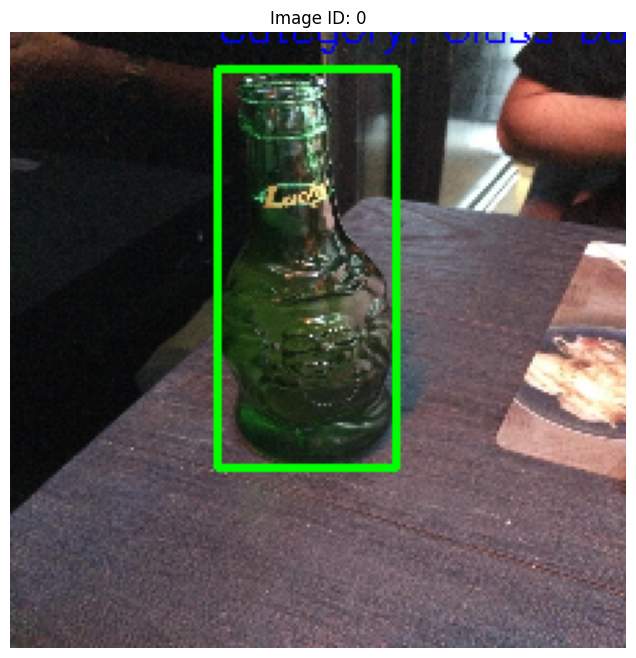

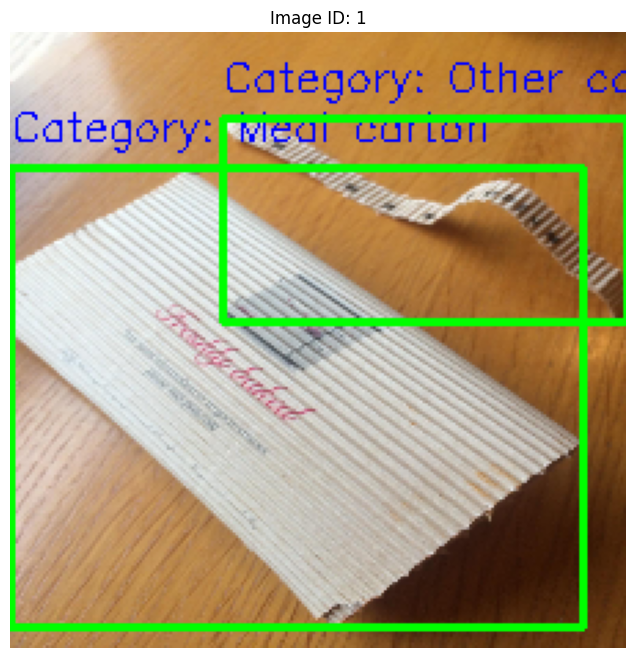

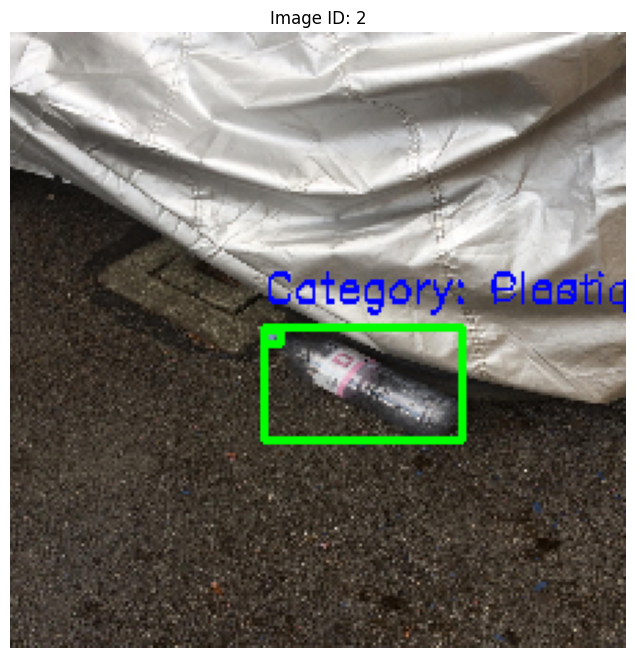

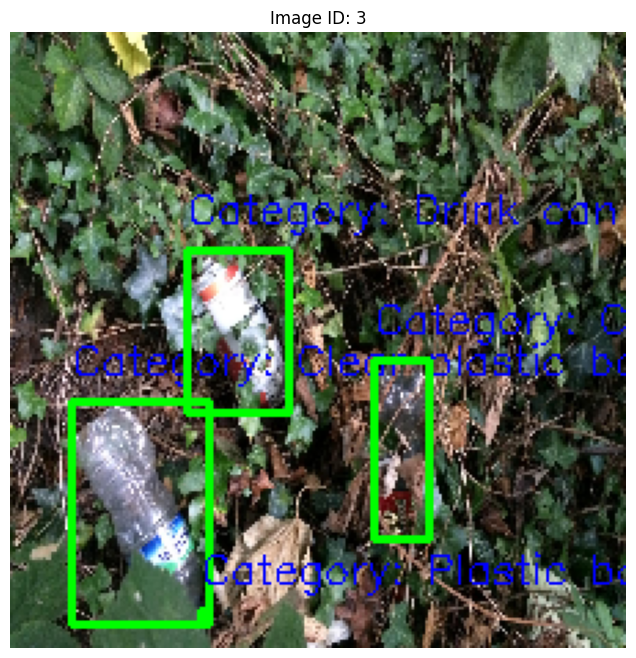

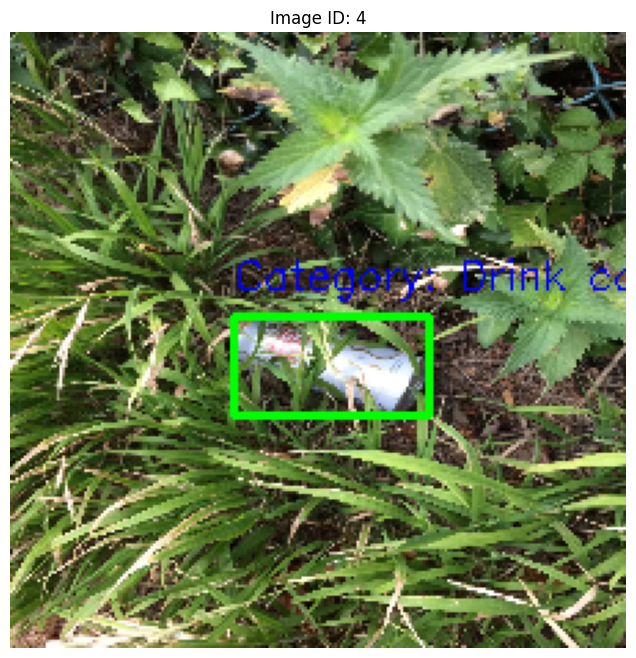

In [ ]:
def load_and_display_taco_data(annotation_file, data_dir, desired_categories=None, target_size=(224, 224), max_images=5):
    """
    Load the TACO dataset and display images with bounding boxes for specified categories.
    If no desired categories are provided, display all available classes.

    Parameters:
        annotation_file (str): Path to the TACO annotations JSON file.
        data_dir (str): Path to the directory containing the dataset images.
        desired_categories (dict, optional): Mapping of category IDs to new category IDs or labels. If None, use all classes.
        target_size (tuple): Target size for resizing the images (default: (224, 224)).
        max_images (int): Maximum number of images to display (default: 5).
    """
    # Load TACO annotations
    data = load_taco_annotations(annotation_file, data_dir)

    # Handle all classes if desired_categories is None
    if not desired_categories:
        desired_categories = {cat['id']: cat['name'] for cat in data['categories']}
        print("Displaying all categories:", desired_categories)
    else:
        # Validate desired categories against the dataset
        all_category_ids = {cat['id'] for cat in data['categories']}
        filtered_categories = {cat_id: label for cat_id, label in desired_categories.items() if cat_id in all_category_ids}
        if not filtered_categories:
            print("Error: None of the desired categories match the dataset categories.")
            return
        desired_categories = filtered_categories
        print("Using desired categories:", desired_categories)

    # Group annotations by image_id
    grouped_annotations = {}
    for ann in data['annotations']:
        if ann['category_id'] in desired_categories:
            image_id = ann['image_id']
            if image_id not in grouped_annotations:
                grouped_annotations[image_id] = []
            # Remap category_id using desired_categories dictionary
            ann['category_id'] = desired_categories[ann['category_id']]
            grouped_annotations[image_id].append(ann)

    # Display images with bounding boxes
    images_displayed = 0
    for image_id, annotations in grouped_annotations.items():
        if images_displayed >= max_images:
            break

        # Find image info
        image_info = next((item for item in data['images'] if item['id'] == image_id), None)
        if not image_info:
            continue

        # Load image
        image_path = os.path.join(data_dir, image_info['file_name'])
        image = cv2.imread(image_path)
        if image is None:
            print(f"Could not load image at {image_path}")
            continue

        # Resize image
        h_orig, w_orig = image.shape[:2]
        image_resized = cv2.resize(image, target_size)
        h_resized, w_resized = target_size

        # Draw bounding boxes
        for ann in annotations:
            bbox = ann['bbox']
            x_min, y_min, width, height = bbox
            x_max = x_min + width
            y_max = y_min + height

            # Scale bounding box to resized image
            x_min = int((x_min / w_orig) * w_resized)
            y_min = int((y_min / h_orig) * h_resized)
            x_max = int((x_max / w_orig) * w_resized)
            y_max = int((y_max / h_orig) * h_resized)

            # Draw rectangle and label
            image_resized = cv2.rectangle(image_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            label = f"Category: {ann['category_id']}"
            cv2.putText(image_resized, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        # Display the image with bounding boxes
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Image ID: {image_id}")
        plt.show()
        images_displayed += 1

# Display all categories
load_and_display_taco_data(annotation_file, data_dir, target_size=(224, 224), max_images=5)

## Selecting Desired Classes

In [ ]:
desired_categories = {
    5: 0,   # "Clear plastic bottle"
    12: 1,  # "Drink can"
    36: 2,  # "Plastic film"
}

In [ ]:
display_classes(data_dir, annotation_file, desired_classes=desired_categories)

Displaying desired classes in the TACO dataset:
Class ID 5: Clear plastic bottle
Class ID 12: Drink can
Class ID 36: Plastic film


## Visualizing Distribution of Selected TACO Dataset Categories Before Augmentation
This function analyzes and visualizes the distribution of selected categories in the TACO dataset before applying any augmentation. It uses horizontal bar charts to show the number of objects and images per category, along with their respective percentages. The tool helps in understanding the category composition, allowing for more informed decisions when planning data augmentation strategies.

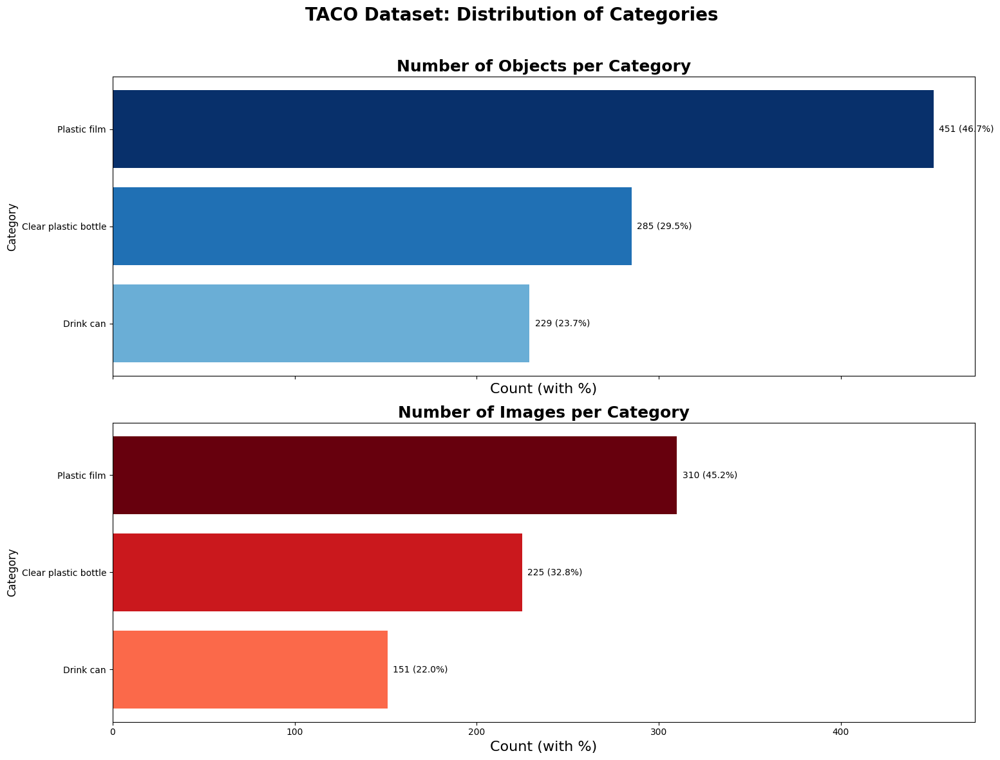

In [ ]:
def visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=None):
    """
    Visualize the distribution of categories in the TACO dataset as a side-by-side
    bar chart for object counts and image counts per category.

    Parameters:
    - data_dir (str): Directory where the dataset is located.
    - annotation_file (str): Path to the annotations JSON file.
    - desired_categories (dict, optional): A mapping from category IDs to desired class labels.
    """

    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # If desired_categories is provided, filter the annotations
    if desired_categories:
        valid_category_ids = set(desired_categories.keys())
        categories = {cat_id: categories[cat_id] for cat_id in valid_category_ids}
    else:
        valid_category_ids = set(categories.keys())

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        if category_id in valid_category_ids:
            # Count the number of objects per category
            object_count[category_id] += 1

            # Track unique images for each category
            image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    category_names = [categories[cat_id] for cat_id in object_count.keys()]
    num_objects = [object_count[cat_id] for cat_id in object_count.keys()]
    num_images = [image_count[cat_id] for cat_id in image_count.keys()]

    # Sort by the number of objects in ascending order
    sorted_indices = sorted(range(len(num_objects)), key=lambda i: num_objects[i])
    category_names_sorted = [category_names[i] for i in sorted_indices]
    num_objects_sorted = [num_objects[i] for i in sorted_indices]
    num_images_sorted = [num_images[i] for i in sorted_indices]

    # Prepare data for plotting percentages
    total_objects = sum(num_objects_sorted)
    total_images = sum(num_images_sorted)
    percentage_objects = [(count / total_objects) * 100 for count in num_objects_sorted]
    percentage_images = [(count / total_images) * 100 for count in num_images_sorted]

    # Plotting horizontal histograms with enhancements
    fig, axes = plt.subplots(2, 1, figsize=(16, 12), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories", fontsize=20, fontweight='bold')

    # Object count bars
    bars1 = axes[0].barh(
        category_names_sorted, num_objects_sorted,
        color=plt.cm.Blues(np.linspace(0.5, 1, len(num_objects_sorted)))
    )
    axes[0].set_title("Number of Objects per Category", fontsize=18, fontweight='bold')
    axes[0].set_xlabel("Count (with %)", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=12)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars1, num_objects_sorted, percentage_objects):
        axes[0].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=10)

    # Image count bars
    bars2 = axes[1].barh(
        category_names_sorted, num_images_sorted,
        color=plt.cm.Reds(np.linspace(0.5, 1, len(num_images_sorted)))
    )
    axes[1].set_title("Number of Images per Category", fontsize=18, fontweight='bold')
    axes[1].set_xlabel("Count (with %)", fontsize=16)
    axes[1].set_ylabel("Category", fontsize=12)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars2, num_images_sorted, percentage_images):
        axes[1].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=10)

    # Tight layout adjustments
    plt.tight_layout(rect=[0, 0, 0.98, 0.96])  # Adjust the right margin to prevent text overflow
    plt.show()

visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=desired_categories)


Using desired categories: {5: 0, 12: 1, 36: 2}


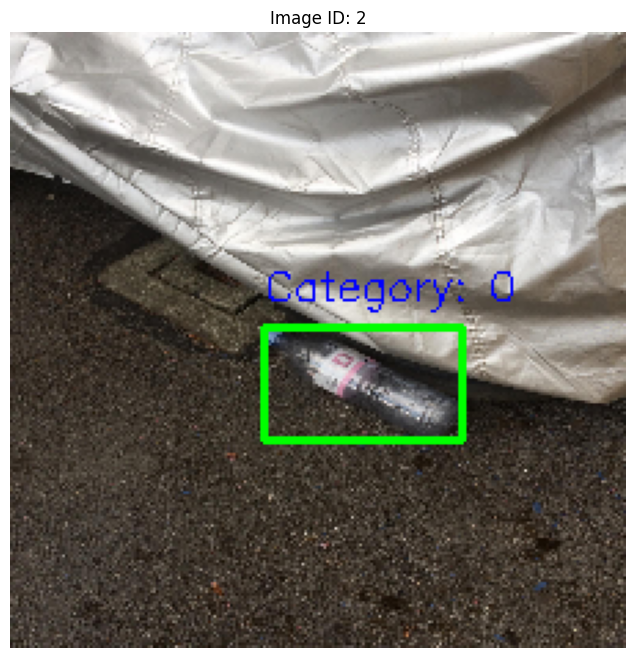

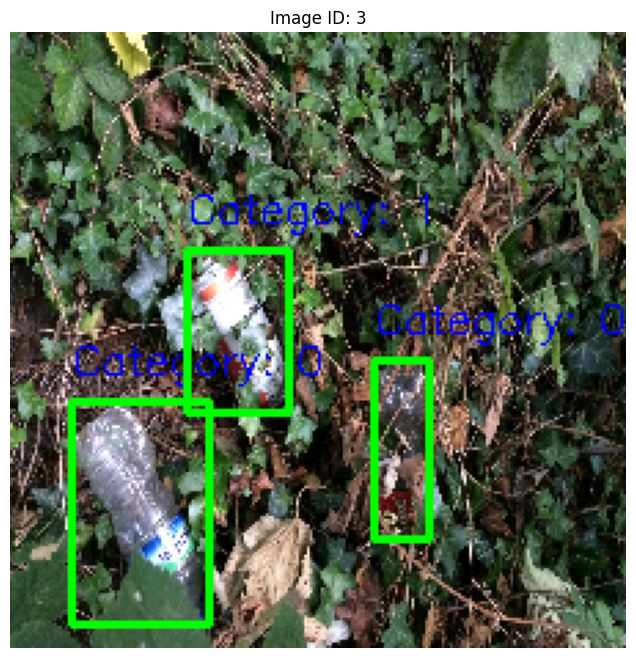

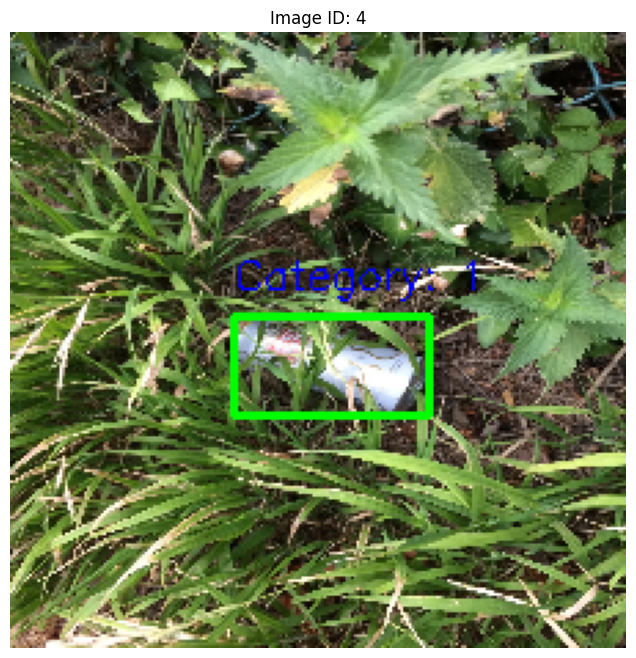

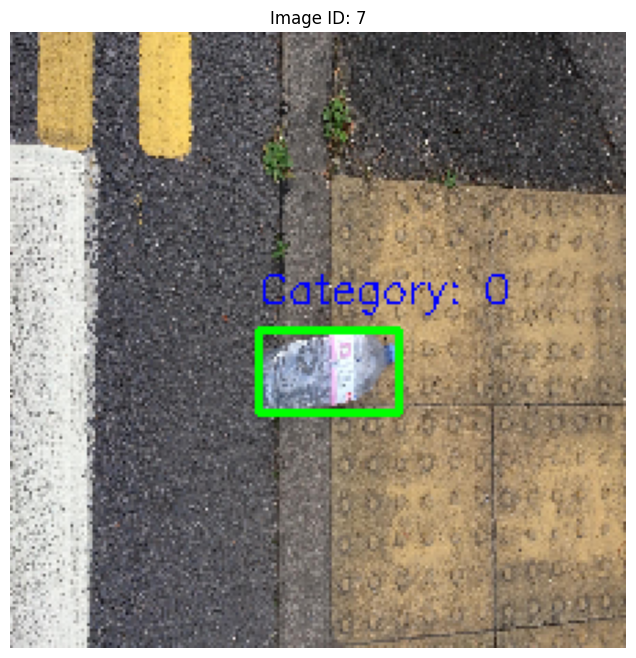

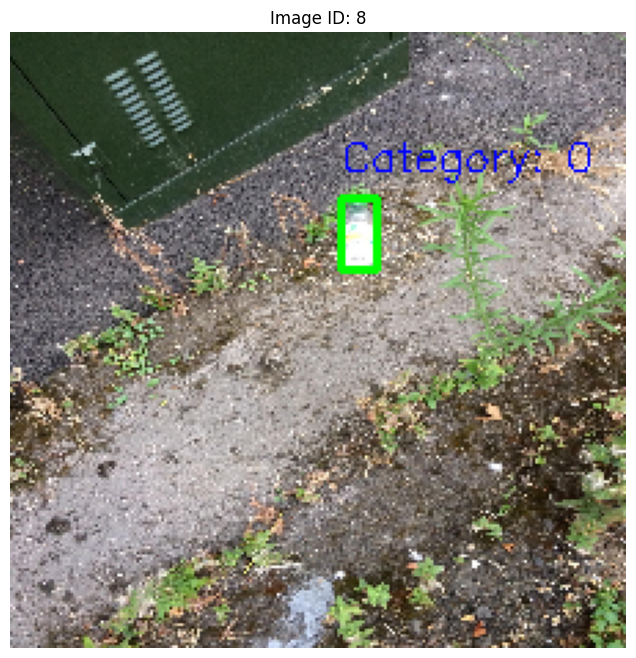

In [ ]:
load_and_display_taco_data(annotation_file, data_dir, desired_categories, target_size=(224, 224), max_images=5)

## Calculating the Number of Classes in the TACO Dataset After Filtering by Selected Categories
This function loads the TACO dataset's annotations and filters them based on the user-defined desired categories. It then calculates and displays the number of unique classes present after filtering. This is useful for understanding how many categories remain in the dataset after selection, providing insights for subsequent steps like training or data augmentation.

In [ ]:
def get_number_of_classes(data_dir, annotation_file, desired_categories):
    """
    Load annotations from the JSON file, filter by desired categories,
    and calculate the number of classes.

    Args:
        data_dir (str): Directory containing the dataset.
        annotation_file (str): Name of the JSON file with annotations.
        desired_categories (dict): A dictionary mapping desired category IDs to new class labels.

    Returns:
        int: Number of classes after filtering by desired categories.
    """
    # Load annotations from the JSON file
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Filter annotations for the desired categories
    filtered_annotations = [
        ann for ann in annotations['annotations']
        if ann['category_id'] in desired_categories
    ]

    # Map the filtered category IDs to new class labels
    mapped_labels = set(desired_categories[ann['category_id']] for ann in filtered_annotations)

    # Display the number of unique categories in the filtered dataset
    num_classes = len(mapped_labels)
    print(f"Number of classes in the TACO dataset after filtering: {num_classes}")

    return num_classes

num_classes = get_number_of_classes(data_dir, annotation_file, desired_categories)

Number of classes in the TACO dataset after filtering: 3


## Loading, Preprocessing, and Splitting the TACO Dataset into Train, Validation, and Test Sets
This function loads images, bounding boxes, and class labels from the TACO dataset while normalizing the bounding box coordinates and resizing the images. It also filters the dataset based on user-defined categories, if specified. After processing, the dataset is split into training, validation, and test sets, with adjustable sizes for the validation and test subsets. This preprocessing function is crucial for preparing the dataset for model training, ensuring that the images and annotations are properly formatted and ready for use.

In [ ]:
def load_and_preprocess_taco_data(data_dir, annotation_file='TACO/annotations.json', desired_categories=None, test_size=0.1, val_size=0.2, target_size=(224, 224)):
    """
    Load images, bounding boxes, and class labels from the TACO dataset,
    normalize bounding boxes and images, filter specific categories,
    and split the dataset into train, validation, and test sets.
    """
    images = []
    bboxes = []
    classes = []

    # Load annotations from JSON
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Process annotations and images
    for ann in tqdm(annotations['annotations']):
        # Filter based on desired categories
        if desired_categories and ann['category_id'] not in desired_categories:
            continue

        image_id = ann['image_id']
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image using OpenCV
        img = cv2.imread(image_path)
        if img is None:
            continue

        # Extract bounding box and remap class label
        bbox = ann['bbox']  # Format: [x_min, y_min, width, height]
        class_label = desired_categories[ann['category_id']] if desired_categories else ann['category_id'] #####

        # Normalize bounding box coordinates
        h, w = img.shape[:2]
        bbox_normalized = [bbox[0] / w, bbox[1] / h, bbox[2] / w, bbox[3] / h]

        # Resize and normalize the image
        img_resized = cv2.resize(img, target_size)
        img_normalized = img_resized / 255.0

        # Store images, bounding boxes, and class labels
        images.append(img_normalized)
        bboxes.append(bbox_normalized)
        classes.append(class_label)

    images = np.array(images)
    bboxes = np.array(bboxes)
    classes = np.array(classes)

    # Split into train, validation, and test sets
    X_train, X_temp, y_train_bboxes, y_temp_bboxes, y_train_classes, y_temp_classes = train_test_split(
        images, bboxes, classes, test_size=test_size + val_size, random_state=42)

    val_size_adjusted = val_size / (val_size + test_size)  # Adjust validation split within the remaining data
    X_val, X_test, y_val_bboxes, y_test_bboxes, y_val_classes, y_test_classes = train_test_split(
        X_temp, y_temp_bboxes, y_temp_classes, test_size=val_size_adjusted, random_state=42)

    return (X_train, y_train_bboxes, y_train_classes), (X_val, y_val_bboxes, y_val_classes), (X_test, y_test_bboxes, y_test_classes)

(train_images, train_bboxes, train_classes), (val_images, val_bboxes, val_classes), (test_images, test_bboxes, test_classes) = load_and_preprocess_taco_data(data_dir, annotation_file, desired_categories)

100%|██████████| 4784/4784 [01:01<00:00, 77.92it/s] 


## Implementation of a CNN for Object Detection

In [ ]:
tf.config.run_functions_eagerly(True)

## Custom Loss fct implementation
This function custom_loss computes a combined loss for an object detection task by calculating both bounding box and classification losses. It first extracts the ground truth and predicted bounding boxes (bbox_true, bbox_pred) and class labels (class_true, class_pred), then computes the loss for bounding boxes using Smooth L1 loss (Huber loss) and classification loss using Sparse Categorical Crossentropy. These two losses are summed to return the total loss, which is used to optimize the model. Debug print statements help in inspecting the input/output values during training.

In [ ]:
def custom_loss(y_true, y_pred):
    bbox_true = y_true[:, :4]  # First 4 values are bounding boxes
    class_true = tf.cast(y_true[:, 4:], tf.int32)  # Remaining values are class labels

    bbox_pred = y_pred[:, :4]
    class_pred = y_pred[:, 4:]

    # Bounding box loss (e.g., Mean Squared Error)
    bbox_loss = tf.reduce_mean(tf.square(bbox_true - bbox_pred))

    # Classification loss (e.g., Sparse Categorical Crossentropy)
    class_loss = tf.reduce_mean(
        tf.keras.losses.sparse_categorical_crossentropy(class_true, class_pred)
    )

    # Log individual losses for tracking
    tf.summary.scalar("bbox_loss", bbox_loss, step=0)
    tf.summary.scalar("class_loss", class_loss, step=0)

    # Weighted sum of losses
    total_loss = bbox_loss + class_loss
    return total_loss


## Functions for evaluation after each epoch
In this code, we’re evaluating the performance of our object detection model using key metrics like Intersection over Union (IoU), Average Precision (AP), and mean Average Precision (mAP). The compute_iou function calculates the IoU between predicted and ground truth bounding boxes, which tells us how well the predicted box overlaps with the actual object. The compute_ap function calculates the Average Precision for a class by comparing the predicted bounding boxes with the ground truth, considering true positives, false positives, and false negatives, and using the IoU threshold. Then, we use the compute_map_at_multiple_iou function to calculate the mean Average Precision at different IoU thresholds (e.g., 0.5, 0.75), which gives us a more complete evaluation of our model’s accuracy. Finally, the EvaluationCallback class is a custom Keras callback that computes these metrics at the end of each training epoch so we can track how well our model is performing in real-time during training.

In [ ]:
# IoU calculation
def compute_iou(bbox1, bbox2):
    x1, y1, w1, h1 = bbox1
    x2, y2, w2, h2 = bbox2

    # Calculate the intersection coordinates
    x_inter = max(x1, x2)
    y_inter = max(y1, y2)
    w_inter = min(x1 + w1, x2 + w2) - x_inter
    h_inter = min(y1 + h1, y2 + h2) - y_inter

    # No intersection
    if w_inter <= 0 or h_inter <= 0:
        return 0.0

    # Calculate areas
    intersection_area = w_inter * h_inter
    bbox1_area = w1 * h1
    bbox2_area = w2 * h2
    union_area = bbox1_area + bbox2_area - intersection_area

    return intersection_area / union_area

def compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold=0.2):
    """Compute Average Precision (AP) for a single class."""
    tp = []
    fp = []
    fn = []  # False negatives
    matched = set()  # To track already-matched ground truth boxes

    # Sort predictions by confidence (assume descending confidence scores)
    predictions = list(zip(pred_bboxes, pred_classes))
    predictions = sorted(predictions, key=lambda x: -x[1])  # Sort by confidence

    for pred_bbox, pred_class in predictions:
        found_match = False
        for i, true_bbox in enumerate(true_bboxes):
            if i in matched:  # Skip if this ground truth is already matched
                continue
            iou = compute_iou(pred_bbox, true_bbox)
            if iou >= iou_threshold and pred_class == true_classes[i]:
                found_match = True
                matched.add(i)
                break

        if found_match:
            tp.append(1)
            fp.append(0)
            fn.append(0)  # No false negative because we have a match
        else:
            tp.append(0)
            fp.append(1)
            fn.append(1)  # False negative because no match

    # Convert to cumulative TP, FP, FN
    tp = np.cumsum(tp)
    fp = np.cumsum(fp)
    fn = np.cumsum(fn)

    # Calculate precision and recall
    precision = tp / (tp + fp + 1e-16)
    recall = tp / (tp + fn + 1e-16)  # False negatives added in recall

    # Compute AP as the area under the precision-recall curve
    ap = 0
    for i in range(len(precision) - 1):
        ap += (recall[i + 1] - recall[i]) * precision[i + 1]

    return ap, precision[-1], recall[-1]

# Compute mean Average Precision (mAP) at multiple IoU thresholds
def compute_map_at_multiple_iou(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_thresholds=[0.5, 0.75, 0.9]):
    aps = []
    for iou_threshold in iou_thresholds:
        ap, precision, recall = compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold)
        aps.append(ap)
        print(f"IoU Threshold: {iou_threshold:.2f} | AP: {ap:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")

    map_value = np.mean(aps)
    map_value = abs(map_value)
    return map_value

## Custom Callbacks

The EvaluationCallback class is designed to evaluate an object detection model's performance on the validation set during training. It computes key evaluation metrics such as precision, recall, mAP@50, and mAP@50-95 at the end of each epoch. The callback uses Intersection over Union (IoU) thresholds to assess the accuracy of predicted bounding boxes and class labels. The metrics are stored for later analysis and plotting. This callback helps in monitoring the model's performance on the validation data, ensuring it improves over time based on standard object detection evaluation measures.

In [ ]:
class EvaluationCallback(Callback):
    def __init__(self, val_images, val_bboxes, val_classes, iou_threshold=0.2):
        super().__init__()
        self.val_images = val_images
        self.val_bboxes = val_bboxes
        self.val_classes = val_classes
        self.iou_threshold = iou_threshold
        self.precisions = []
        self.recalls = []
        self.map_50s = []
        self.map_50_95s = []

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        # Predict bounding boxes and class labels for the validation set
        predictions = self.model.predict(self.val_images)
        pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
        pred_classes = np.argmax(predictions[:, 4:], axis=-1)

        # Compute precision and recall
        ap_50, precision, recall = compute_ap(
            pred_bboxes, self.val_bboxes,
            pred_classes, self.val_classes,
            iou_threshold=self.iou_threshold
        )

        # Compute mAP@50
        ap_50 = self.compute_map_50(pred_bboxes, self.val_bboxes, pred_classes, self.val_classes)

        # Compute mAP@50-95
        map_50_95 = self.compute_map_50_95(pred_bboxes, self.val_bboxes, pred_classes, self.val_classes)

        # Store metrics for plotting
        self.precisions.append(precision)
        self.recalls.append(recall)
        self.map_50s.append(ap_50)
        self.map_50_95s.append(map_50_95)

    def compute_map_50(self, pred_bboxes, val_bboxes, pred_classes, val_classes):
        return compute_map_at_multiple_iou(pred_bboxes, val_bboxes, pred_classes, val_classes, iou_thresholds=[0.2])

    def compute_map_50_95(self, pred_bboxes, val_bboxes, pred_classes, val_classes):
        return compute_map_at_multiple_iou(pred_bboxes, val_bboxes, pred_classes, val_classes, iou_thresholds=[0.5, 0.75, 0.9])

The LossTrackingCallback class is used to track and log various loss metrics during the training process of an object detection model. It captures the overall loss, validation loss, as well as the bounding box loss (bbox_loss) and class loss (class_loss) for both the training and validation sets. These losses are stored at the end of each epoch for further analysis and plotting. By monitoring these losses, the callback provides insights into how well the model is learning to predict accurate bounding boxes and class labels, enabling better optimization and debugging of the training process.

In [ ]:
class LossTrackingCallback(Callback):
    def __init__(self):
        super().__init__()
        self.losses = []
        self.val_losses = []
        self.bbox_losses = []
        self.class_losses = []
        self.val_bbox_losses = []
        self.val_class_losses = []

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        # Append loss and validation loss for plotting later
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))

        # Collect the bbox and class losses
        bbox_loss = logs.get('bbox_loss', 0)
        class_loss = logs.get('class_loss', 0)
        self.bbox_losses.append(bbox_loss)
        self.class_losses.append(class_loss)

        # Collect validation bbox and class losses
        val_bbox_loss = logs.get('val_bbox_loss', 0)
        val_class_loss = logs.get('val_class_loss', 0)
        self.val_bbox_losses.append(val_bbox_loss)
        self.val_class_losses.append(val_class_loss)

## CNN Architecture, Build and Compile
The build_deeper_object_detection_model function constructs a deeper convolutional neural network (CNN) for object detection. The model consists of multiple convolutional layers with increasing filter sizes (64, 128, 256, 512) followed by max-pooling layers to reduce spatial dimensions. After flattening the feature maps, a fully connected layer with 512 units and a dropout layer is added to prevent overfitting. The model outputs two separate predictions: one for the bounding box (4 values) using a sigmoid activation function and another for class labels using a softmax activation. The model is then compiled using the Adam optimizer with a custom loss function for training. The model is suited for tasks involving both bounding box regression and object classification.

In [ ]:
def build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3):
    input_layer = Input(shape=input_shape)

    # Deeper Convolutional layers
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.3)(x)

    # Bounding box output (4 values)
    bbox_output = layers.Dense(4, activation='sigmoid')(x)

    # Class output (classification)
    class_output = layers.Dense(num_classes, activation='softmax')(x)

    # Concatenate the outputs
    output = layers.Concatenate()([bbox_output, class_output])

    model = Model(inputs=input_layer, outputs=output)
    return model

# Build and compile the deeper model
model_1 = build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3)
optimizer = Adam(learning_rate=1e-3)  # Adjust the learning rate as needed
model_1.compile(optimizer=optimizer, loss=custom_loss)
model_1.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 224, 224, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 112, 112, 64)   │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 112, 112, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 56, 56, 128)    │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 56, 56, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 28, 28, 256)    │              0 │ conv2d_2[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 28, 28, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 14, 14, 512)    │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 100352)         │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │     51,380,736 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 4)              │          2,052 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 3)              │          1,539 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 7)              │              0 │ dense_1[0][0],         │
│                           │                        │                │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 52,935,303 (201.93 MB)

 Trainable params: 52,935,303 (201.93 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
train_classes = train_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
val_classes = val_classes.reshape(-1, 1)

train_targets = np.concatenate([train_bboxes, train_classes], axis=-1)
val_targets = np.concatenate([val_bboxes, val_classes], axis=-1)

## Train before Data Augmentation: model_1

In [ ]:
loss_callback = LossTrackingCallback()
evaluation_callback = EvaluationCallback(
    val_images=val_images,
    val_bboxes=val_bboxes,
    val_classes=val_classes,
    iou_threshold=0.3
)

history = model_1.fit(
    train_images,
    train_targets,
    validation_data=(val_images, val_targets),
    epochs=100,
    batch_size=64,
    callbacks=[loss_callback, evaluation_callback]
)

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.50 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 714ms/step - loss: 6.6947 - val_loss: 9.6560
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: 0.1709 | Precision: 0.0417 | Recall: 0.0417
IoU Threshold: 0.50 | AP: 0.1455 | Precision: 0.0208 | Recall: 0.0208
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 272ms/step - loss: 2.9411 - val_loss: 1.1161
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: -0.3237 | Precision: 0.0729 | Recall: 0.0729
IoU Threshold: 0.50 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.000

# Visualizing Training and Evaluation Metrics before Augmentation
This code visualizes the evaluation metrics (Precision, Recall, mAP@50, and mAP@50-95) after training a model. It uses matplotlib to create a plot with multiple subplots, where the first section (subplot 3) displays the performance of the model over epochs. Precision, Recall, mAP@50, and mAP@50-95 are plotted against the number of epochs, each with distinct colors and markers for clarity

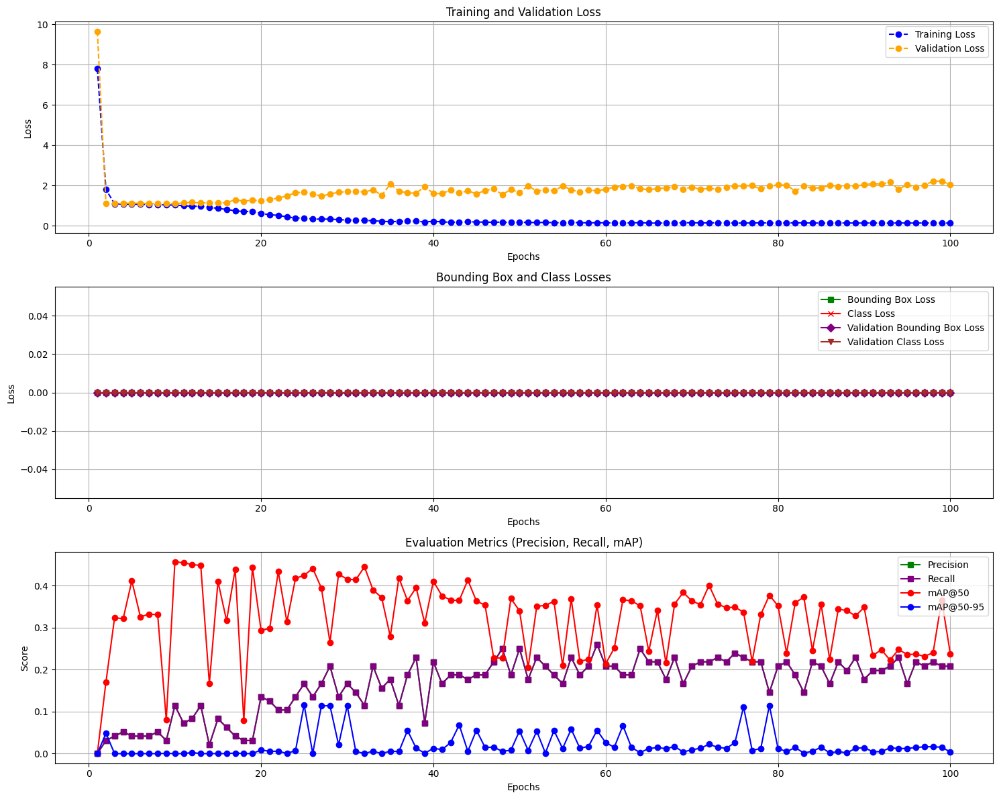

In [ ]:
import matplotlib.pyplot as plt

def plot_training_metrics(loss_callback, evaluation_callback):
    """
    Plots training and evaluation metrics including:
    - Training and validation loss
    - Bounding box and class losses
    - Evaluation metrics: Precision, Recall, mAP@50, mAP@50-95

    Parameters:
    loss_callback (object): A callback object that stores loss values.
    evaluation_callback (object): A callback object that stores evaluation metrics.
    """
    plt.figure(figsize=(15, 12))

    # Plot Losses
    plt.subplot(3, 1, 1)
    plt.plot(range(1, len(loss_callback.losses) + 1), loss_callback.losses, label='Training Loss', marker='o', color='blue', linestyle='--')
    plt.plot(range(1, len(loss_callback.val_losses) + 1), loss_callback.val_losses, label='Validation Loss', marker='o', color='orange', linestyle='--')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot bbox and class losses
    plt.subplot(3, 1, 2)
    plt.plot(range(1, len(loss_callback.bbox_losses) + 1), loss_callback.bbox_losses, label='Bounding Box Loss', marker='s', color='green', linestyle='-')
    plt.plot(range(1, len(loss_callback.class_losses) + 1), loss_callback.class_losses, label='Class Loss', marker='x', color='red', linestyle='-')
    plt.plot(range(1, len(loss_callback.val_bbox_losses) + 1), loss_callback.val_bbox_losses, label='Validation Bounding Box Loss', marker='D', color='purple', linestyle='-')
    plt.plot(range(1, len(loss_callback.val_class_losses) + 1), loss_callback.val_class_losses, label='Validation Class Loss', marker='v', color='brown', linestyle='-')
    plt.title('Bounding Box and Class Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Evaluation Metrics (Precision, Recall, mAP@50)
    plt.subplot(3, 1, 3)
    plt.plot(range(1, len(evaluation_callback.precisions) + 1), evaluation_callback.precisions, label='Precision', marker='s', color='green', linestyle='-')
    plt.plot(range(1, len(evaluation_callback.recalls) + 1), evaluation_callback.recalls, label='Recall', marker='s', color='purple', linestyle='-')
    plt.plot(range(1, len(evaluation_callback.map_50s) + 1), evaluation_callback.map_50s, label='mAP@50', marker='o', color='red', linestyle='-')
    plt.plot(range(1, len(evaluation_callback.map_50_95s) + 1), evaluation_callback.map_50_95s, label='mAP@50-95', marker='o', color='blue', linestyle='-')
    plt.title('Evaluation Metrics (Precision, Recall, mAP)')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.tight_layout()
    plt.show()

plot_training_metrics(loss_callback, evaluation_callback)

## Evaluating the model before Data Augmentation: model_1
Here, we have evaluated the model's performance using a custom metric based on Intersection over Union (IoU) thresholds of 0.50 and 0.75. The results indicate the following:

At IoU Threshold 0.50, the Average Precision (AP) is 0.0469, with both Precision and Recall at 0.1031.
At the stricter IoU Threshold 0.75, the AP drops significantly to 0.0050, with Precision and Recall decreasing to 0.0206.
However, upon reviewing the results, it seems that our custom evaluation metrics might not be fully correct in terms of Precision and Recall. These values suggest that the model is not performing well, especially at higher IoU thresholds, which may indicate issues with how these metrics are calculated or interpreted. The metrics emphasize the need to cross-validate with other standard evaluation methods, such as confusion matrix-based metrics, to ensure a more accurate assessment of model performance.

In [ ]:
# Evaluate on Validation
val_loss = model_1.evaluate(val_images, val_targets, batch_size=32)

# Evaluate on Test
test_classes = test_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
test_targets = np.concatenate([test_bboxes, test_classes], axis=-1)
test_loss = model_1.evaluate(test_images, test_targets, batch_size=32)


# Metrics on Test Data
predictions = model_1.predict(test_images, batch_size=32)
pred_bboxes = predictions[:, :4]
pred_classes = np.argmax(predictions[:, 4:], axis=-1)
mean_iou = np.mean([compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))])
map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes)

print(f"Validation Loss: {val_loss}")
print(f"Test Loss: {test_loss}")
print(f"Mean IoU: {mean_iou}")
print(f"mAP@50-95: {map_50_95}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 1.9327
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 2.3778
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.50 | AP: 0.0469 | Precision: 0.1031 | Recall: 0.1031
IoU Threshold: 0.75 | AP: 0.0050 | Precision: 0.0206 | Recall: 0.0206
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
Validation Loss: 2.0532329082489014
Test Loss: 2.250852108001709
Mean IoU: 0.050652876983190556
mAP@50-95: 0.017299324861811627


## Confusion Matrix before Data Augmentation: model_1

Confusion Matrix:
[[30  7 22]
 [13 19 19]
 [14  5 65]]


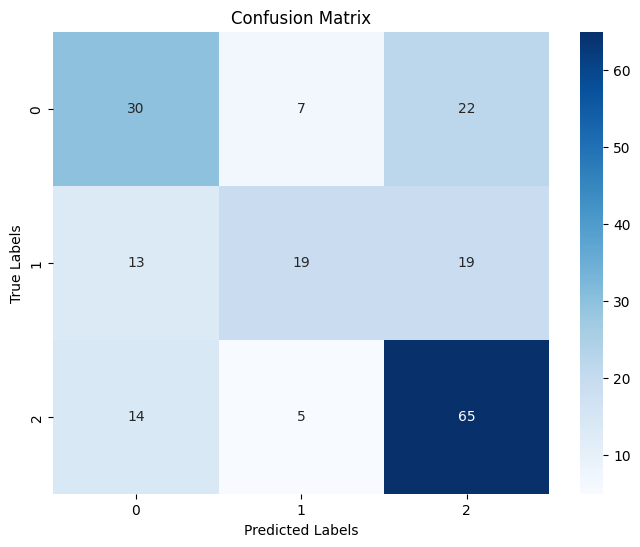

In [ ]:
cm_model_1 = confusion_matrix(test_classes, pred_classes)

# Print confusion matrix
print("Confusion Matrix:")
print(cm_model_1)
# Plot Confusion Matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_model_1, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(test_classes), yticklabels=np.unique(test_classes))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

The results from the confusion matrix provide a more convincing and balanced view of the model's performance, with Accuracy consistent across all classes (58.76%). The Precision and Recall values show a clear differentiation between classes, such as Class 2 with high Recall (77.38%) and Class 1 with lower Recall (37.25%). In contrast, the custom evaluation metrics based on IoU thresholds show very low Precision (around 0.02-0.10) and Recall (around 0.02-0.10), which indicates that these metrics might not fully reflect the model's true performance. This discrepancy suggests that our custom evaluation metrics still need refinement, whereas the confusion matrix provides a more reliable and comprehensive evaluation of the model's performance.

In [ ]:
# Calculate accuracy
accuracy = np.trace(cm_model_1) / np.sum(cm_model_1) * 100

# Calculate precision and recall for each class
precision = np.diagonal(cm_model_1) / np.sum(cm_model_1, axis=0) * 100
recall = np.diagonal(cm_model_1) / np.sum(cm_model_1, axis=1) * 100

# Print precision, recall, and accuracy for each class
for i in range(cm_model_1.shape[0]):
    print(f"Class {i}: Accuracy = {accuracy:.4f}, Precision = {precision[i]:.4f}, Recall = {recall[i]:.4f}")


Class 0: Accuracy = 58.7629, Precision = 52.6316, Recall = 50.8475
Class 1: Accuracy = 58.7629, Precision = 61.2903, Recall = 37.2549
Class 2: Accuracy = 58.7629, Precision = 61.3208, Recall = 77.3810


## Implementing Data Augmentation
This code filters a dataset of annotations to focus on specific categories of interest, identified by their unique IDs. It begins by defining the target categories as [5, 12, 36], which correspond to particular objects, such as "Clear plastic bottle," "Drink can," and "Plastic film." The dataset, data['annotations'], contains a list of annotations for objects in images, with each annotation including details like the object's category ID and bounding box. Using a list comprehension, the code iterates through all annotations and selects only those whose category_id matches one of the specified target categories. The filtered results are stored in the filtered_annotations list, which now contains only the relevant data. This step streamlines the dataset, ensuring that further processing or analysis focuses solely on the desired categories, improving efficiency and clarity

In [ ]:
# Categories of interest
target_categories = [5, 12, 36]

# Filter annotations for the target categories
filtered_annotations = [ann for ann in data['annotations'] if ann['category_id'] in target_categories]

# Check available category IDs in filtered annotations
category_ids_in_annotations = {ann['category_id'] for ann in data['annotations']}
print("Category IDs in annotations:", category_ids_in_annotations)

# Filter annotations for target categories
filtered_annotations = [ann for ann in data['annotations'] if ann['category_id'] in target_categories]

# Check filtered annotations
print(f"Filtered annotations for target categories: {len(filtered_annotations)}")

# Function to count objects for target categories
def count_objects_for_targets(filtered_annotations, target_categories):
    counts = {cat: 0 for cat in target_categories}
    for ann in filtered_annotations:
        if ann['category_id'] in counts:
            counts[ann['category_id']] += 1
    return counts

# Get the counts for target categories
target_object_counts = count_objects_for_targets(filtered_annotations, target_categories)

# Print target object counts
print("Target object counts:", target_object_counts)

# Check if there are categories with no objects
target_count = max(target_object_counts.values()) if target_object_counts else 0
print(f"Max target count: {target_count}")


Category IDs in annotations: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59}
Filtered annotations for target categories: 965
Target object counts: {5: 285, 12: 229, 36: 451}
Max target count: 451


In [ ]:
target_count = max(target_object_counts.values())  # Match to the largest category

## Class Balancing for Selected Catogries Based on Objects
This code is designed to balance underrepresented categories in the TACO dataset by augmenting images. It begins by analyzing the object counts for the target categories and determining the maximum count. To achieve balance, it generates additional images using augmentation techniques such as horizontal flipping, brightness adjustment, contrast enhancement, and rotation. Augmented images are saved, and new annotations are added to the dataset. To prevent over-augmentation, a safeguard limits the number of augmentations per category. Finally, the augmented data is integrated into the existing annotations file, creating a more balanced dataset for model training.

In [ ]:
# Define the maximum number of augmentations per category (safeguard)
max_augmentations_per_category = 500  # Set a reasonable limit

# Define augmentation function
def augment_image(image):
    image = Image.fromarray((image.numpy() * 255).astype(np.uint8))

    # Random horizontal flip
    if tf.random.uniform([]) > 0.5:
        image = ImageOps.mirror(image)

    # Random brightness
    delta = tf.random.uniform([], -0.2, 0.2).numpy()
    image = Image.fromarray(np.clip(np.array(image) + delta * 255, 0, 255).astype(np.uint8))

    # Random contrast
    factor = tf.random.uniform([], 0.8, 1.2).numpy()
    mean = np.mean(np.array(image), axis=(0, 1), keepdims=True)
    image = Image.fromarray(np.clip((np.array(image) - mean) * factor + mean, 0, 255).astype(np.uint8))

    # Random rotation
    angle = tf.random.uniform([], -15, 15).numpy()
    image = image.rotate(angle, resample=Image.BILINEAR)

    # Convert back to TensorFlow tensor
    image = tf.convert_to_tensor(np.array(image), dtype=tf.float32) / 255.0
    return image

# Augment and save images to balance classes
def balance_and_augment(data, filtered_annotations, target_categories, output_dir, annotations_file):
    # Count objects for each target category
    counts = defaultdict(int)
    annotations_by_category = defaultdict(list)
    for ann in filtered_annotations:
        if ann['category_id'] in target_categories:
            counts[ann['category_id']] += 1
            annotations_by_category[ann['category_id']].append(ann)

    # Determine the maximum object count
    max_count = max(counts.values())
    print(f"Target object counts: {counts}")
    print(f"Maximum count: {max_count}")

    os.makedirs(output_dir, exist_ok=True)
    augmented_annotations = []

    # Augment images for each target category
    for category_id, anns in annotations_by_category.items():
        current_count = len(anns)
        additional_needed = max_count - current_count

        # Cap the number of augmentations per category
        additional_needed = min(additional_needed, max_augmentations_per_category)

        print(f"Augmenting category {category_id}: {current_count} → {max_count} ({additional_needed} augmentations needed)")

        for i in range(additional_needed):
            ann = anns[i % current_count]  # Cycle through existing annotations
            image_path = f"/content/TACO/data/{data['images'][ann['image_id']]['file_name']}"

            # Load image
            image = Image.open(image_path).convert('RGB')
            image = tf.convert_to_tensor(np.array(image), dtype=tf.float32) / 255.0  # Normalize

            # Augment image
            augmented_image = augment_image(image)
            augmented_image = tf.image.convert_image_dtype(augmented_image, dtype=tf.uint8)  # Convert back to uint8

            # Save augmented image
            augmented_path = os.path.join(output_dir, f"aug_{category_id}_{i}.jpg")
            tf.keras.preprocessing.image.save_img(augmented_path, augmented_image.numpy())

            # Add new annotation for the augmented image
            augmented_ann = ann.copy()
            augmented_ann['file_name'] = os.path.basename(augmented_path)
            augmented_annotations.append(augmented_ann)

    # Load the existing annotations file
    with open(annotations_file, 'r') as f:
        annotations = json.load(f)

    # Add augmented annotations to the original annotations
    annotations['annotations'].extend(augmented_annotations)

    # Save the updated annotations to the file
    with open(annotations_file, 'w') as f:
        json.dump(annotations, f, indent=4)

    return augmented_annotations

# Output directory
output_dir = '/content/TACO/data/augmented'

# Path to the annotations file
annotations_file = '/content/TACO/data/annotations.json'  # Replace with the actual path to your annotations file

# Run the balancing and augmentation process
balanced_augmented_annotations = balance_and_augment(data,filtered_annotations, target_categories, output_dir, annotations_file)

print(f"Augmentation complete. {len(balanced_augmented_annotations)} augmented annotations added.")

Target object counts: defaultdict(<class 'int'>, {5: 285, 12: 229, 36: 451})
Maximum count: 451
Augmenting category 5: 285 → 451 (166 augmentations needed)
Augmenting category 12: 229 → 451 (222 augmentations needed)
Augmenting category 36: 451 → 451 (0 augmentations needed)
Augmentation complete. 388 augmented annotations added.


## Visualizing Selected Categories After Augmentation
*   Number of Objects per Categories
*   Number of Images per Categories

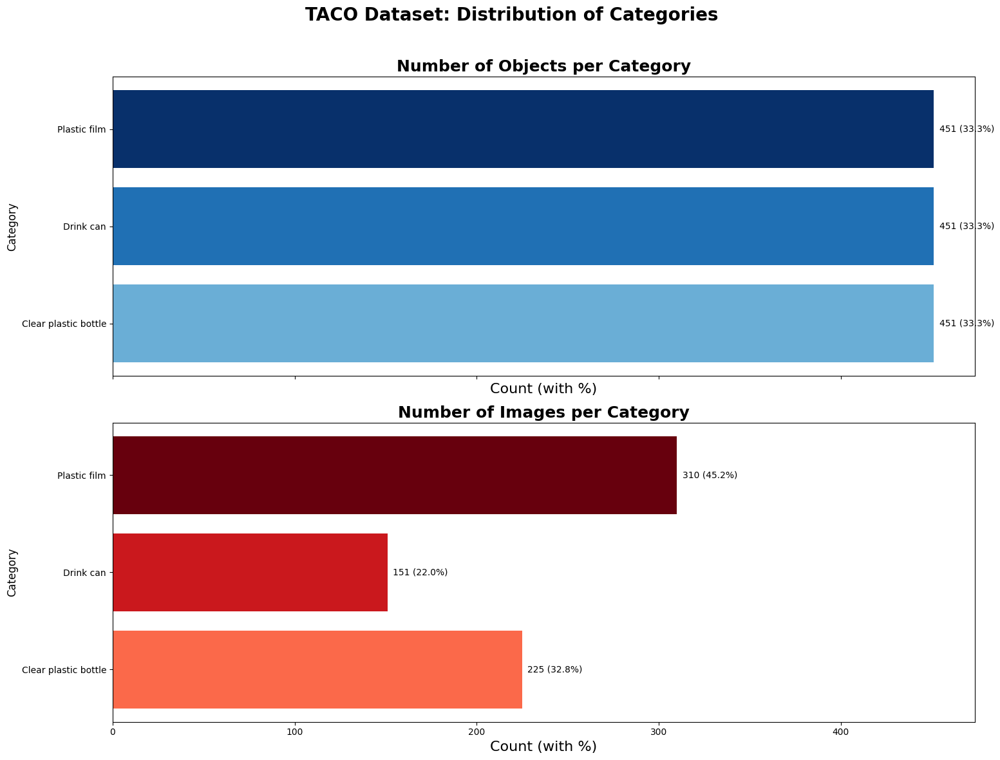

In [ ]:
visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=desired_categories)

## Use This to Delete the Augmented Images

In [ ]:
# import os

# # Define the output directory where augmented images are stored
# output_dir = '/content/TACO/data/augmented'

# # Function to delete the output directory and its contents
# def delete_existing_augmented_images(output_dir):
#     if os.path.exists(output_dir):
#         shutil.rmtree(output_dir)
#         print(f"Deleted existing augmented images in: {output_dir}")
#     else:
#         print(f"No existing augmented images folder found at: {output_dir}")

# # Run the function to delete the existing augmented images
# delete_existing_augmented_images(output_dir)


Deleted existing augmented images in: /content/TACO/data/augmented


## Training after Data Augmentation : model_2

In [ ]:
# Build and compile the deeper model
model_2 = build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3)
optimizer = Adam(learning_rate=1e-3) # 1e-4 >> 1e-3
model_2.compile(optimizer=optimizer, loss=custom_loss)
model_2.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 224, 224, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 112, 112, 64)   │              0 │ conv2d_4[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 112, 112, 128)  │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 56, 56, 128)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 56, 56, 256)    │        295,168 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 28, 28, 256)    │              0 │ conv2d_6[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 28, 28, 512)    │      1,180,160 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 14, 14, 512)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 100352)         │              0 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 512)            │     51,380,736 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 512)            │              0 │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 4)              │          2,052 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 3)              │          1,539 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 7)              │              0 │ dense_4[0][0],         │
│ (Concatenate)             │                        │                │ dense_5[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 52,935,303 (201.93 MB)

 Trainable params: 52,935,303 (201.93 MB)

 Non-trainable params: 0 (0.00 B)

## Training after Data Augmentation : model_2

In [ ]:
loss_callback = LossTrackingCallback()
evaluation_callback = EvaluationCallback(
    val_images=val_images,
    val_bboxes=val_bboxes,
    val_classes=val_classes,
    iou_threshold=0.3
)

history = model_2.fit(
    train_images,
    train_targets,
    validation_data=(val_images, val_targets),
    epochs=100,
    batch_size=64,
    callbacks=[loss_callback, evaluation_callback]
)

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: -0.4704 | Precision: 0.0625 | Recall: 0.0625
IoU Threshold: 0.50 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 284ms/step - loss: 3.4514 - val_loss: 1.1739
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: -0.4145 | Precision: 0.0625 | Recall: 0.0625
IoU Threshold: 0.50 | AP: 0.0344 | Precision: 0.0208 | Recall: 0.0208
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 272ms/step - loss: 1.1175 - val_loss: 1.1249
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.20 | AP: -0.4647 | Precision: 0.0625 | Recall: 0.0625
IoU Threshold: 0.50 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.00

# Visualizing Training and Evaluation Metrics after Augmentation: model_2

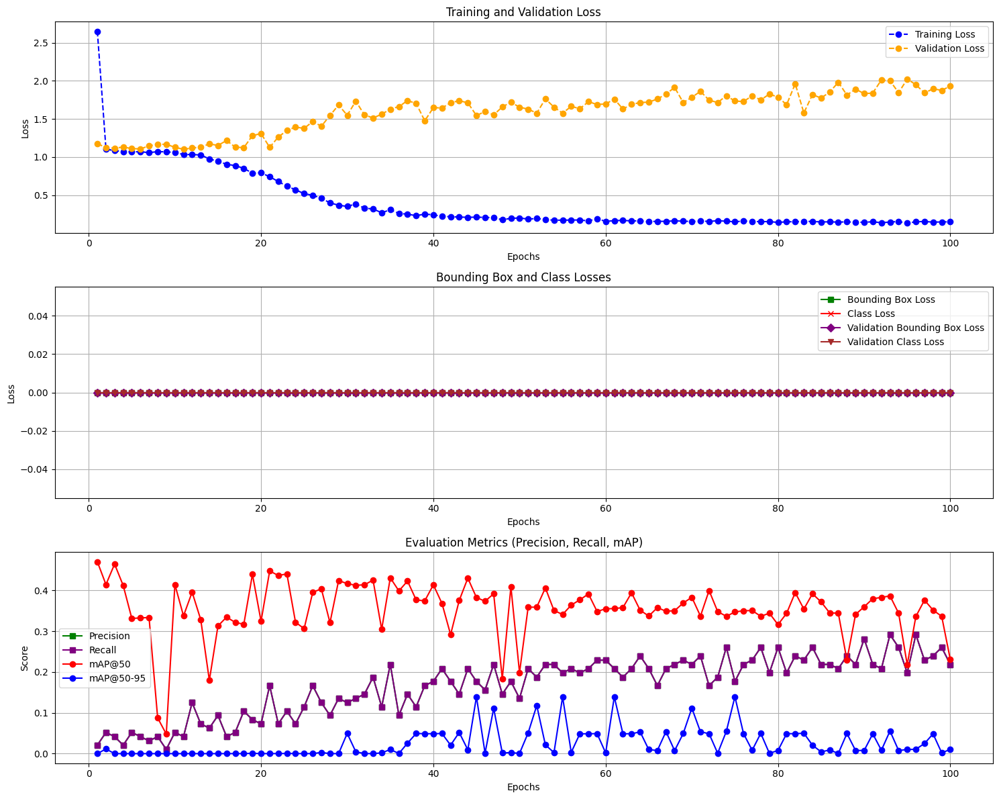

In [ ]:
plot_training_metrics(loss_callback, evaluation_callback)

## Evaluating the model after Data Augmentation: model_2

In [ ]:
# Evaluate on Validation
val_loss = model_2.evaluate(val_images, val_targets, batch_size=32)

# Evaluate on Test
test_classes = test_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
test_targets = np.concatenate([test_bboxes, test_classes], axis=-1)
test_loss = model_2.evaluate(test_images, test_targets, batch_size=32)


# Metrics on Test Data
predictions = model_2.predict(test_images, batch_size=32)
pred_bboxes = predictions[:, :4]
pred_classes = np.argmax(predictions[:, 4:], axis=-1)
mean_iou = np.mean([compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))])
map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes)

print(f"Validation Loss: {val_loss}")
print(f"Test Loss: {test_loss}")
print(f"Mean IoU: {mean_iou}")
print(f"mAP@50-95: {map_50_95}")


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 1.5576

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1.8978
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2.0703
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
IoU Threshold: 0.50 | AP: 0.0501 | Precision: 0.1237 | Recall: 0.1237
IoU Threshold: 0.75 | AP: 0.0013 | Precision: 0.0103 | Recall: 0.0103
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
Validation Loss: 1.9302359819412231
Test Loss: 2.081207752227783
Mean IoU: 0.05253032630719333
mAP@50-95: 0.017134454084636538


## Confusion matrix after Data Augmentation : model_2

Confusion Matrix:
[[24  6 29]
 [17 16 18]
 [13  7 64]]


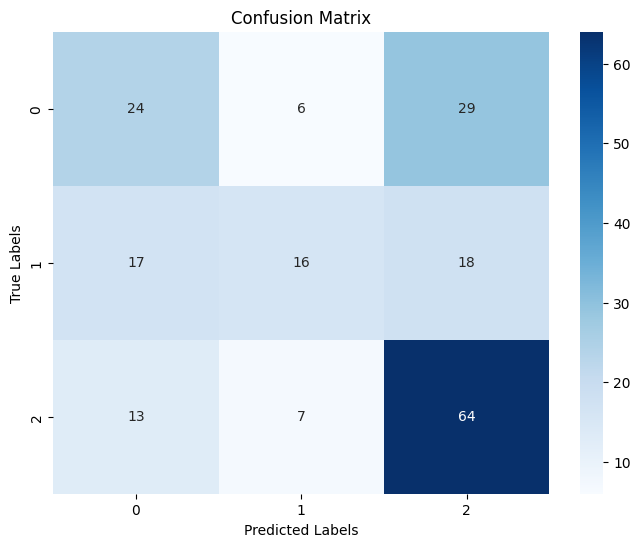

In [ ]:
cm_model_2 = confusion_matrix(test_classes, pred_classes)

# Print confusion matrix
print("Confusion Matrix:")
print(cm_model_2)

# Plot Confusion Matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_model_2, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(test_classes), yticklabels=np.unique(test_classes))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [ ]:
# Calculate accuracy
accuracy = np.trace(cm_model_2) / np.sum(cm_model_2) * 100

# Calculate precision and recall for each class
precision = np.diagonal(cm_model_2) / np.sum(cm_model_2, axis=0) * 100
recall = np.diagonal(cm_model_2) / np.sum(cm_model_2, axis=1) * 100

# Print precision, recall, and accuracy for each class
for i in range(cm_model_2.shape[0]):
    print(f"Class {i}: Accuracy = {accuracy:.4f}, Precision = {precision[i]:.4f}, Recall = {recall[i]:.4f}")


Accuracy: 53.6082
Class 0: Accuracy = 53.6082, Precision = 44.4444, Recall = 40.6780
Class 1: Accuracy = 53.6082, Precision = 55.1724, Recall = 31.3725
Class 2: Accuracy = 53.6082, Precision = 57.6577, Recall = 76.1905


## Object Detection Inference after Data Augmentation: Visualizing Predictions and Ground Truths on the TACO Dataset

## Visualization of Model Predictions: Before and After Augmentation
This code visualizes and compares object detection model predictions before and after data augmentation. It processes a set of image filenames, displaying true and predicted bounding boxes from two trained models side by side. The code uses the TACO dataset and annotations to dynamically map class IDs to class names, denormalizes bounding boxes, and overlays them on the images. The visualization helps highlight the differences in model performance, showcasing how augmentation impacts prediction accuracy and localization. Each image is displayed with red bounding boxes for predictions and blue for ground truths, labeled with their respective class names.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


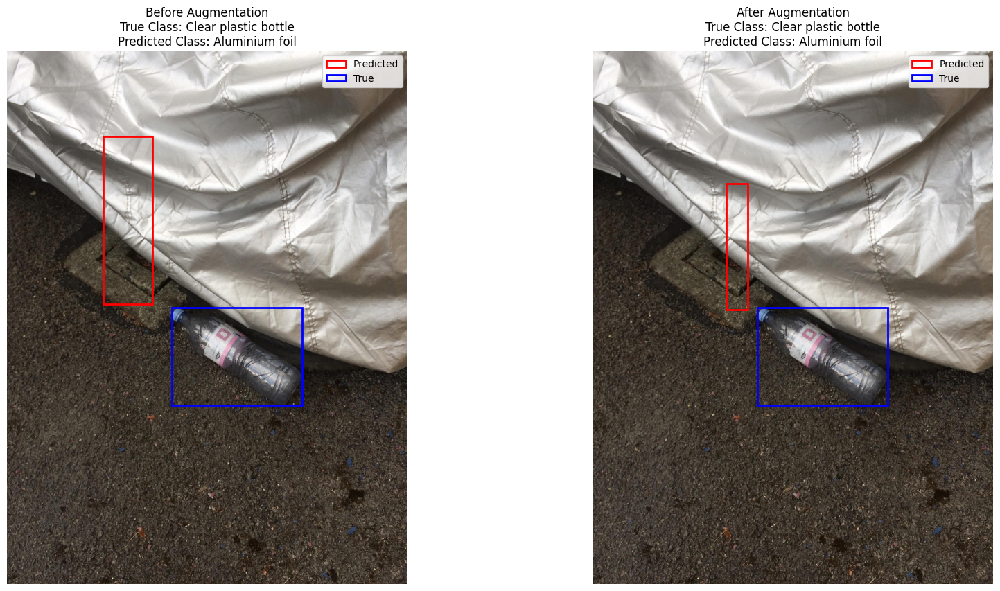

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


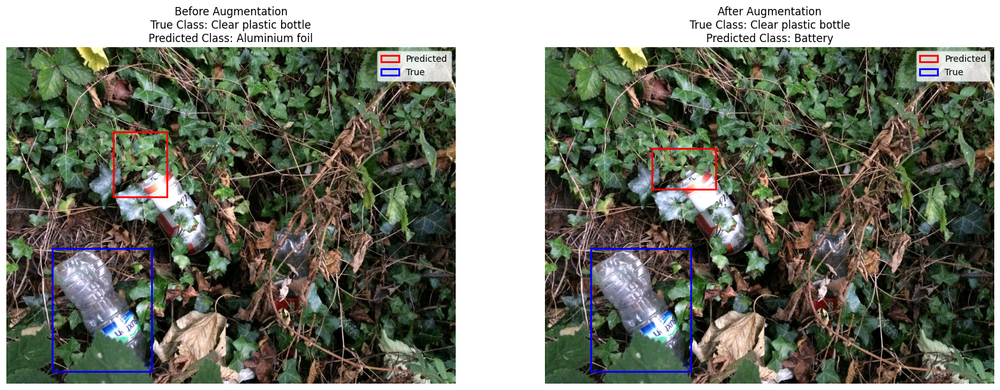

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


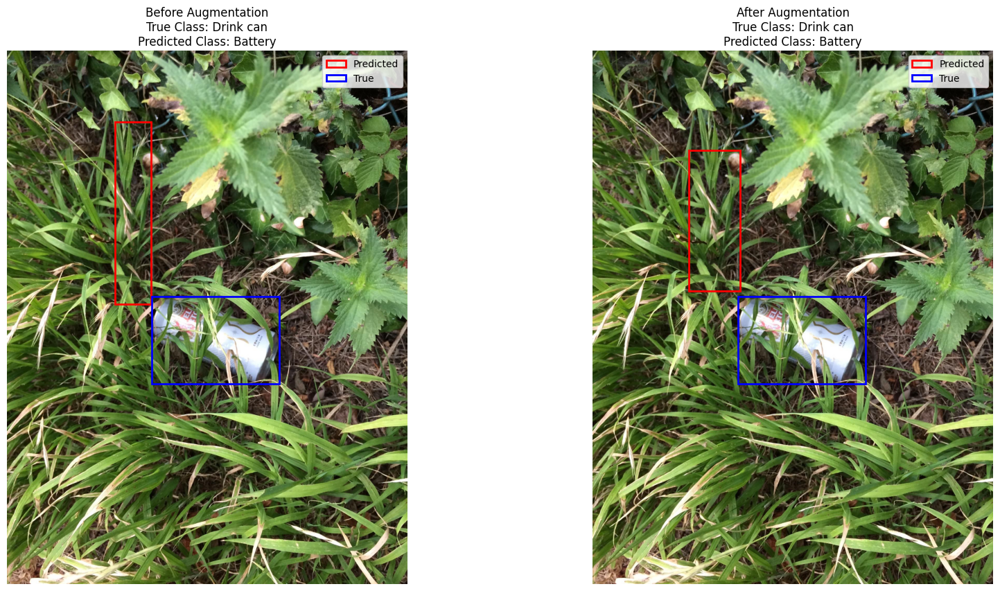

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


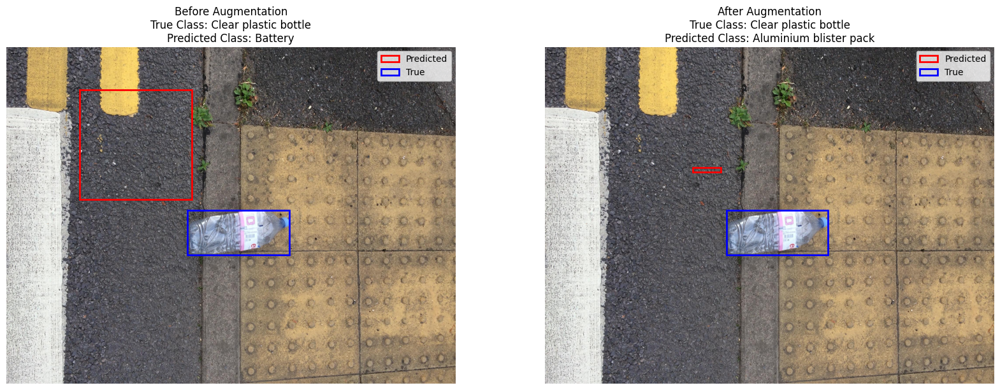

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


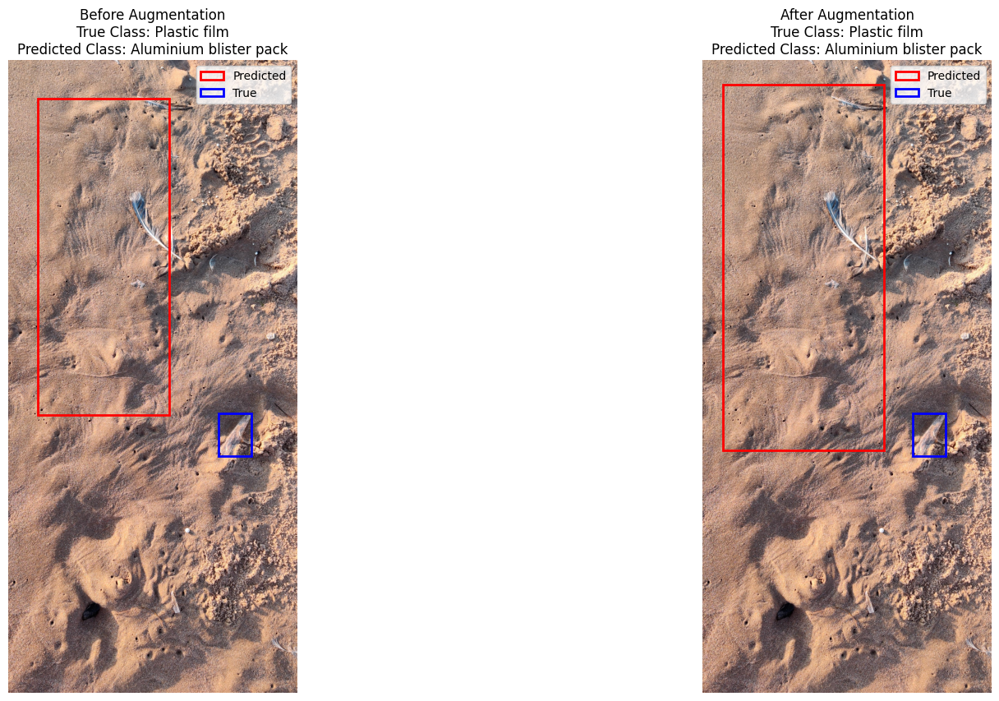

In [ ]:
def display_images_with_predictions(data_dir, annotation_file, image_filenames, model_1, model_2):
    """
    Display images with predicted and true bounding boxes for two models side by side.

    Parameters:
        data_dir (str): Path to the directory containing the dataset.
        annotation_file (str): Path to the annotation file (JSON).
        image_filenames (list): List of image filenames to be processed.
        model_1 (keras.Model): First trained model for inference.
        model_2 (keras.Model): Second trained model for inference.
    """
    # Load the category map (class IDs to class names)
    def display_classes(data_dir, annotation_file):
        with open(os.path.join(data_dir, annotation_file), 'r') as f:
            annotations = json.load(f)
        category_map = {cat['id']: cat['name'] for cat in annotations['categories']}
        return category_map

    # Load the category map
    category_map = display_classes(data_dir, annotation_file)

    # Iterate through the list of image filenames
    for custom_image_filename in image_filenames:
        # Path to the custom image
        custom_image_path = os.path.join(data_dir, custom_image_filename)

        # Load the custom image
        custom_image = cv2.imread(custom_image_path)
        if custom_image is None:
            raise FileNotFoundError(f"Image not found at {custom_image_path}")

        # Get the original image dimensions
        original_height, original_width = custom_image.shape[:2]

        # Resize the image to the model's expected input size (224x224)
        resized_image = cv2.resize(custom_image, (224, 224))

        # Normalize the resized image
        resized_image_normalized = resized_image / 255.0
        resized_image_normalized = np.expand_dims(resized_image_normalized, axis=0)

        # Run inference with both models
        predictions_1 = model_1.predict(resized_image_normalized)
        predictions_2 = model_2.predict(resized_image_normalized)

        # Parse prediction outputs
        def parse_predictions(predictions):
            if len(predictions.shape) == 2 and predictions.shape[1] == 7:
                pred_bbox = predictions[0][:4]  # First four values are bounding box (normalized)
                pred_class_probs = predictions[0][4:]  # Last values are class probabilities
                pred_class = np.argmax(pred_class_probs)  # Predicted class
                return pred_bbox, pred_class
            else:
                raise ValueError("Unexpected prediction output shape. Expected a shape like (1, 7).")

        pred_bbox_1, pred_class_1 = parse_predictions(predictions_1)
        pred_bbox_2, pred_class_2 = parse_predictions(predictions_2)

        # Denormalize the predicted bounding boxes
        def denormalize_bbox(pred_bbox):
            return [
                pred_bbox[0] * original_width,
                pred_bbox[1] * original_height,
                pred_bbox[2] * original_width,
                pred_bbox[3] * original_height
            ]

        denormalized_pred_bbox_1 = denormalize_bbox(pred_bbox_1)
        denormalized_pred_bbox_2 = denormalize_bbox(pred_bbox_2)

        # Load annotations from the JSON file
        with open(os.path.join(data_dir, annotation_file), 'r') as f:
            annotations = json.load(f)

        # Find the annotation for the image by matching the file_name
        image_annotation = next((img for img in annotations['images'] if img['file_name'] == custom_image_filename), None)

        if image_annotation is None:
            raise ValueError(f"No annotation found for image {custom_image_filename}")

        # Get the image ID to find corresponding annotations
        image_id = image_annotation['id']

        # Find the corresponding bounding box and class label in the annotations
        annotation = next((ann for ann in annotations['annotations'] if ann['image_id'] == image_id), None)

        if annotation is None:
            raise ValueError(f"No bounding box or class found for image {custom_image_filename} in annotations.")

        # True bounding box and class label
        true_bbox = annotation['bbox']  # Format: [x_min, y_min, width, height]
        true_class_index = annotation['category_id']

        # Denormalize the true bounding box
        denormalized_true_bbox = [
            true_bbox[0],  # x_min
            true_bbox[1],  # y_min
            true_bbox[2],  # width
            true_bbox[3]   # height
        ]

        # Get class labels dynamically from the category map
        true_class_label = category_map.get(true_class_index, "Unknown Class")
        predicted_class_label_1 = category_map.get(pred_class_1, "Unknown Class")
        predicted_class_label_2 = category_map.get(pred_class_2, "Unknown Class")

        # Visualize the original image with bounding boxes from both models
        fig, axes = plt.subplots(1, 2, figsize=(20, 10))  # Create side-by-side subplots

        for ax, model_idx, pred_bbox, pred_class_label, title in zip(
                axes, [1, 2], [denormalized_pred_bbox_1, denormalized_pred_bbox_2],
                [predicted_class_label_1, predicted_class_label_2],
                ["Before Augmentation", "After Augmentation"]):

            ax.imshow(cv2.cvtColor(custom_image, cv2.COLOR_BGR2RGB))

            # Draw predicted bounding box for the current model
            ax.add_patch(plt.Rectangle(
                (pred_bbox[0], pred_bbox[1]),
                pred_bbox[2] - pred_bbox[0],
                pred_bbox[3] - pred_bbox[1],
                fill=False, edgecolor='red', linewidth=2, label="Predicted"
            ))

            # Draw true bounding box in blue
            ax.add_patch(plt.Rectangle(
                (denormalized_true_bbox[0], denormalized_true_bbox[1]),
                denormalized_true_bbox[2],
                denormalized_true_bbox[3],
                fill=False, edgecolor='blue', linewidth=2, label="True"
            ))

            # Add title and legend
            ax.set_title(f"{title}\nTrue Class: {true_class_label}\nPredicted Class: {pred_class_label}")
            ax.legend(loc="upper right")
            ax.axis("off")

        plt.show()


# Example of usage
image_filenames = [
    'batch_1/000010.jpg',
    'batch_1/000019.jpg',
    'batch_1/000026.jpg',
    'batch_1/000001.jpg',
    'batch_10/000059.jpg'
]

display_images_with_predictions('/content/TACO/data', 'annotations.json', image_filenames, model_1, model_2)
